In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 646.6/646.6 kB 5.1 MB/s eta 0:00:00


In [ ]:
!pip install fiftyone
!pip install fiftyone-db-ubuntu2204

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 33.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# import zipfile
# import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from ultralytics import YOLO

In [ ]:
# import fiftyone as fo
# print(fo.config)

# Download Dataset

In [ ]:
import fiftyone as fo
import fiftyone.zoo as foz

# change where zoo datasets are downloaded
# NOTE: dataset disimpan dalam folder "/content/datasets"
# agar sesuai dengan default setting dataset ultralytics
fo.config.dataset_zoo_dir = "/content/datasets"

# Load the COCO-2017 dataset
# This will download it from the FiftyOne Dataset Zoo if necessary
dataset = foz.load_zoo_dataset("coco-2017", split="train", label_types=["detections"], classes=["person"], max_samples=3000)
dataset_test = foz.load_zoo_dataset("coco-2017", split="validation", label_types=["detections"], classes=["person"], max_samples=500)

# Print summary information about the view
print(dataset)

Migrating database to v0.22.3


INFO:fiftyone.migrations.runner:Migrating database to v0.22.3


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/content/datasets/coco-2017/train' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/content/datasets/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [2.5s elapsed, 0s remaining, 817.9Mb/s]      


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [2.5s elapsed, 0s remaining, 817.9Mb/s]      


Extracting annotations to '/content/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/content/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Downloading 3000 images


 100% |████████████████| 3000/3000 [5.8m elapsed, 0s remaining, 7.8 images/s]       


INFO:eta.core.utils: 100% |████████████████| 3000/3000 [5.8m elapsed, 0s remaining, 7.8 images/s]       


Writing annotations for 3000 downloaded samples to '/content/datasets/coco-2017/train/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 3000 downloaded samples to '/content/datasets/coco-2017/train/labels.json'


Dataset info written to '/content/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |███████████████| 3000/3000 [23.3s elapsed, 0s remaining, 163.0 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 3000/3000 [23.3s elapsed, 0s remaining, 163.0 samples/s]      


Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/content/datasets/coco-2017/validation' if necessary


Found annotations at '/content/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/content/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading 500 images


 100% |██████████████████| 500/500 [59.6s elapsed, 0s remaining, 8.2 images/s]      


INFO:eta.core.utils: 100% |██████████████████| 500/500 [59.6s elapsed, 0s remaining, 8.2 images/s]      


Writing annotations for 500 downloaded samples to '/content/datasets/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 500 downloaded samples to '/content/datasets/coco-2017/validation/labels.json'


Dataset info written to '/content/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |█████████████████| 500/500 [4.5s elapsed, 0s remaining, 88.5 samples/s]       


INFO:eta.core.utils: 100% |█████████████████| 500/500 [4.5s elapsed, 0s remaining, 88.5 samples/s]       


Dataset 'coco-2017-validation-500' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation-500' created


Name:        coco-2017-train-3000
Media type:  image
Num samples: 3000
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


### Penyesuaian skema folder gambar

In [ ]:
# untuk kemudahan dalam penggunaan yolo, file gambar disusun ulang sesuai dengan yang direkomendasikan oleh ultralytics
# dalam kasus ini: .../images/train dan .../images/val
# path kedua direktory ini nantinya juga harus didaftarkan ke dalam file yaml (lihat "Dataset YAML File" di bawah)

os.makedirs('datasets/coco-2017/images/train', exist_ok=True)
os.makedirs('datasets/coco-2017/images/val', exist_ok=True)

In [ ]:
!cp datasets/coco-2017/train/data/*.jpg datasets/coco-2017/images/train
!cp datasets/coco-2017/validation/data/*.jpg datasets/coco-2017/images/val

# Labels

Pembuatan label di sini berdasarkan data json yang disertakan oleh fiftyone pada proses pengunduhan data sample gambar (jadi prosesnya bisa saja berbeda jika menggunakan data source dari yang lainnya)

In [ ]:
import os
import json
from tqdm import tqdm
import shutil

def make_folders(path="output"):
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    return path

def convert_bbox_coco2yolo(img_width, img_height, bbox):
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

def convert_coco_json_to_yolo_txt(output_path, json_file):

    path = make_folders(output_path)

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each image"):
        img_id = image["id"]
        img_name = image["file_name"]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"] - 1 # index person pada coco-2017 fiftyone adalah 1
                if category == 0:
                  bbox_COCO = anno["bbox"]
                  x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                  f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")

In [ ]:
# di sini label txt ditempatkan dalam folder dengan format: .../labels/train dan .../labels/val
# yang memirroring data gambarnya .../images/train dan .../images/val
# file dalam folder .../labels/... ini, dengan bantuan file yaml (lihat "Dataset YAML File" di bawah), akan langsung dikenali oleh YOLOv8 sebagai file label untuk masing-masing gambar

os.makedirs('datasets/coco-2017/labels/train', exist_ok=True)
os.makedirs('datasets/coco-2017/labels/val', exist_ok=True)

In [ ]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/train", "datasets/coco-2017/train/labels.json")

Annotation txt for each image: 100%|██████████| 3000/3000 [00:10<00:00, 295.32it/s]

Converting COCO Json to YOLO txt finished!


In [ ]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/val", "datasets/coco-2017/validation/labels.json")

Annotation txt for each image: 100%|██████████| 500/500 [00:00<00:00, 1771.02it/s]

Converting COCO Json to YOLO txt finished!


In [ ]:
## jika diperlukan, hapus folder serta isi di dalamnya
# !rm -r datasets/coco-2017/raw
# !rm -r datasets/coco-2017/train
# !rm -r datasets/coco-2017/validation

Pengujan balik untuk melihat apakah konversi annotation telah sesuai

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

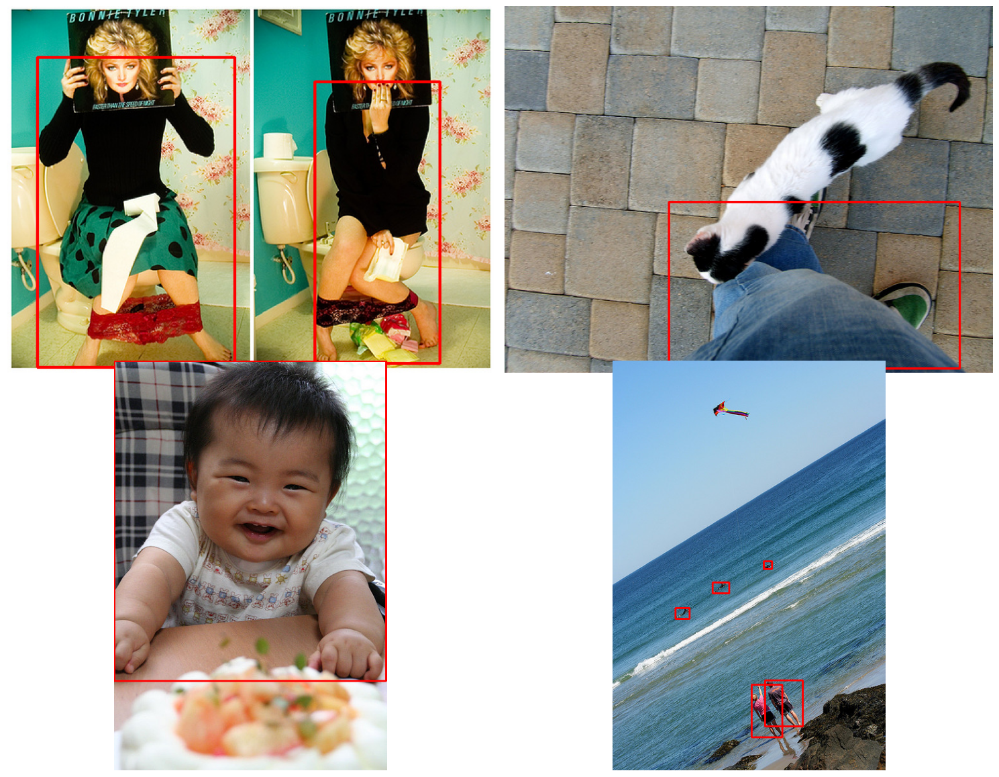

In [ ]:
# Visualize a few training images.
plot(
    image_paths='datasets/coco-2017/images/train',
    label_paths='datasets/coco-2017/labels/train',
    num_samples=4
)

# Dataset YAML File

Path untuk file gambar diatur melalui file yaml

Sedangkan path untuk file label dideduksi dari format folder gambar

In [ ]:
%%writefile coco_person_yolo.yaml
path: 'coco-2017/'
train: 'images/train'
val: 'images/val'

# class names
names:
  0: 'person'


Writing coco_person_yolo.yaml


# Training

In [ ]:
##############################################################
# Tentukan di sini model yg akan diuji. Tambahkan parameter lainnya jika perlu
##############################################################
train_model = 'yolov8n.yaml'
pretrained_weight = 'yolov8n.pt'

EPOCHS = 50
##############################################################

train_data = 'coco_person_yolo.yaml'

In [ ]:
##############################################################
# Tentukan di sini direktori logging hasil training
##############################################################
# NOTE: hasil training (weight dan lainnya) secara default akan disimpan dalam folder 'contents/runs' yang sifatnya temporary.
# Agar disimpan permanen hasil training dipindahkan ke google drive
# NOTE: antara v5 dan v8 terdapat perbedaan nama parameter untuk logging (https://github.com/ultralytics/ultralytics/issues/3527)

# untuk v8
project = '/content/drive/MyDrive/ai_ind_p2_logs'
experiment = 'yolov8_nano_50e' # isian untuk parameter name. Sebagai subfolder dalam 'project'

# untuk v5
save_dir = '/content/drive/MyDrive/ai_ind_p2_logs/yolov5'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir .

<IPython.core.display.Javascript object>

In [ ]:
## cli version
# train_model = 'yolov8n.yaml'
# pretrained_weight = 'yolov8n.pt'
# EPOCHS=1
## Build a new model from YAML, transfer pretrained weights to it and start training
# !yolo detect train data=coco_person_yolo.yaml model={train_model} pretrained={pretrained_weight} epochs={EPOCHS} imgsz=640

In [ ]:
# Logging
os.makedirs(project, exist_ok=True) # v8
# os.makedirs(save_dir, exist_ok=True) # v5

In [ ]:
# build from YAML and transfer weights
model = YOLO(train_model).load(pretrained_weight)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 6.23M/6.23M [00:00<00:00, 70.7MB/s]

Transferred 355/355 items from pretrained weights


In [ ]:
# Train the model
results = model.train(
    data=train_data,
    epochs=EPOCHS,
    imgsz=640,
    project=project, # v8
    name=experiment, # v8
    # save_dir=save_dir, # v5
)

Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=coco_person_yolo.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/ai_ind_p2_logs, name=yolov8_nano_50e4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 13.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/coco-2017/labels/train... 3000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3000/3000 [00:01<00:00, 2016.02it/s]


train: New cache created: /content/datasets/coco-2017/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/coco-2017/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 1325.06it/s]

val: New cache created: /content/datasets/coco-2017/labels/val.cache


Plotting labels to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.45G      1.312      1.647      1.282         78        640: 100%|██████████| 188/188 [01:36<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.67it/s]


                   all        500       2090      0.559      0.431      0.443      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.19G      1.538      1.637      1.444         47        640: 100%|██████████| 188/188 [01:31<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]

                   all        500       2090      0.585      0.439      0.472      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.21G      1.628      1.671      1.506         73        640: 100%|██████████| 188/188 [01:32<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.96it/s]


                   all        500       2090      0.549      0.432      0.444       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.34G      1.615      1.656      1.518         22        640: 100%|██████████| 188/188 [01:29<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.65it/s]


                   all        500       2090      0.563      0.417      0.431      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.22G      1.573      1.581      1.483         68        640: 100%|██████████| 188/188 [01:29<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.84it/s]

                   all        500       2090      0.623      0.435      0.497      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.29G      1.544      1.533       1.47         60        640: 100%|██████████| 188/188 [01:30<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.10it/s]


                   all        500       2090       0.62      0.482      0.523      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       2.3G      1.513      1.488      1.451         84        640: 100%|██████████| 188/188 [01:28<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]


                   all        500       2090      0.583      0.471      0.497      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.32G      1.498      1.467      1.434         61        640: 100%|██████████| 188/188 [01:28<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]


                   all        500       2090      0.626      0.482       0.53      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.21G       1.47      1.437       1.42         57        640: 100%|██████████| 188/188 [01:31<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]

                   all        500       2090      0.645      0.476       0.54      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       2.2G       1.44      1.401      1.395         63        640: 100%|██████████| 188/188 [01:28<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]


                   all        500       2090      0.617      0.511      0.555      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.32G       1.43      1.394      1.398         48        640: 100%|██████████| 188/188 [01:30<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.68it/s]

                   all        500       2090      0.662      0.511      0.573      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.21G      1.432      1.383       1.39         50        640: 100%|██████████| 188/188 [01:29<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.64it/s]

                   all        500       2090       0.67      0.495      0.565      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.29G      1.406      1.351      1.375         41        640: 100%|██████████| 188/188 [01:29<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all        500       2090      0.653      0.491      0.557      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.21G      1.384      1.312      1.356         63        640: 100%|██████████| 188/188 [01:30<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.89it/s]

                   all        500       2090      0.663      0.522      0.581       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.22G      1.377      1.299      1.349         41        640: 100%|██████████| 188/188 [01:34<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.75it/s]

                   all        500       2090      0.633      0.537      0.584       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.32G      1.372      1.294      1.352         59        640: 100%|██████████| 188/188 [01:28<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

                   all        500       2090      0.656      0.531      0.593      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.2G      1.359      1.273       1.34         45        640: 100%|██████████| 188/188 [01:29<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.41it/s]

                   all        500       2090      0.685      0.525        0.6      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       2.3G      1.356      1.256      1.334         73        640: 100%|██████████| 188/188 [01:33<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.80it/s]


                   all        500       2090      0.693      0.527      0.611      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.2G       1.33      1.232      1.324         42        640: 100%|██████████| 188/188 [01:29<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

                   all        500       2090      0.678      0.536      0.613      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.23G      1.309      1.209      1.307         45        640: 100%|██████████| 188/188 [01:27<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.05it/s]

                   all        500       2090      0.701      0.525      0.615      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.29G      1.294      1.193        1.3         56        640: 100%|██████████| 188/188 [01:29<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]


                   all        500       2090      0.718      0.551      0.636      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.32G      1.291      1.193      1.298         83        640: 100%|██████████| 188/188 [01:27<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]

                   all        500       2090        0.7       0.54      0.611      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       2.3G      1.286      1.173      1.288         50        640: 100%|██████████| 188/188 [01:29<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.45it/s]

                   all        500       2090      0.723      0.533      0.627      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.22G       1.27      1.151      1.279         53        640: 100%|██████████| 188/188 [01:30<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.67it/s]

                   all        500       2090      0.704      0.562       0.63      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.21G      1.262      1.161      1.278         50        640: 100%|██████████| 188/188 [01:27<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.54it/s]

                   all        500       2090      0.726      0.541      0.634      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.32G      1.256      1.128      1.272         73        640: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.85it/s]

                   all        500       2090      0.707      0.555      0.632      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.28G      1.261      1.136      1.277         64        640: 100%|██████████| 188/188 [01:25<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.87it/s]

                   all        500       2090      0.719      0.568      0.641      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.21G      1.241       1.11      1.264         56        640: 100%|██████████| 188/188 [01:23<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.69it/s]

                   all        500       2090      0.716      0.552      0.647      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.23G      1.231      1.092       1.26         39        640: 100%|██████████| 188/188 [01:22<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all        500       2090      0.711      0.561      0.645      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.21G      1.227      1.101      1.259         40        640: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.71it/s]

                   all        500       2090      0.704      0.567      0.646      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.21G      1.227      1.089      1.251         91        640: 100%|██████████| 188/188 [01:27<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.90it/s]

                   all        500       2090      0.696      0.578      0.641        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.32G      1.214       1.06      1.236         63        640: 100%|██████████| 188/188 [01:29<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]

                   all        500       2090      0.727      0.567      0.655      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.3G      1.188       1.04      1.232         66        640: 100%|██████████| 188/188 [01:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.04it/s]


                   all        500       2090      0.719      0.574      0.651      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.23G      1.194      1.041      1.231         60        640: 100%|██████████| 188/188 [01:29<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.03it/s]

                   all        500       2090      0.705       0.59      0.659      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       2.2G      1.178      1.027      1.225         59        640: 100%|██████████| 188/188 [01:32<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.04it/s]


                   all        500       2090      0.747      0.573      0.667       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       2.3G      1.181      1.031      1.226         72        640: 100%|██████████| 188/188 [01:31<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.47it/s]

                   all        500       2090      0.736      0.581      0.665      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       2.3G      1.174      1.012      1.216         55        640: 100%|██████████| 188/188 [01:29<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.10it/s]

                   all        500       2090      0.718      0.584       0.66      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.24G      1.171      1.004      1.217         50        640: 100%|██████████| 188/188 [01:29<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.09it/s]

                   all        500       2090      0.734      0.588      0.668      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.33G      1.146     0.9899      1.205         80        640: 100%|██████████| 188/188 [01:27<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]


                   all        500       2090      0.727      0.595      0.664      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.33G      1.152     0.9683        1.2         32        640: 100%|██████████| 188/188 [01:28<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.82it/s]


                   all        500       2090      0.746      0.587       0.67      0.421
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.46G      1.138     0.9374      1.182         28        640: 100%|██████████| 188/188 [01:23<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all        500       2090       0.73      0.594      0.665      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.33G      1.114      0.896      1.169         39        640: 100%|██████████| 188/188 [01:21<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:05<00:00,  2.88it/s]

                   all        500       2090      0.725       0.59      0.666      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.32G       1.11       0.89      1.166         28        640: 100%|██████████| 188/188 [01:20<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]

                   all        500       2090      0.733      0.591      0.667      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.33G      1.086      0.859      1.149         54        640: 100%|██████████| 188/188 [01:20<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]


                   all        500       2090      0.726      0.597      0.669      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.33G      1.079     0.8526      1.149         56        640: 100%|██████████| 188/188 [01:24<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.01it/s]

                   all        500       2090      0.735      0.592      0.671      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.33G      1.069     0.8384      1.141         17        640: 100%|██████████| 188/188 [01:20<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]

                   all        500       2090      0.721      0.602      0.671      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.32G      1.057      0.826      1.133         57        640: 100%|██████████| 188/188 [01:24<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]

                   all        500       2090      0.736      0.602       0.67      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.33G      1.057      0.822      1.133         44        640: 100%|██████████| 188/188 [01:20<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.25it/s]

                   all        500       2090      0.727      0.599      0.674      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.33G      1.051     0.8121      1.128         21        640: 100%|██████████| 188/188 [01:19<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.20it/s]

                   all        500       2090      0.735      0.599      0.675      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.33G      1.036     0.7932      1.118         19        640: 100%|██████████| 188/188 [01:19<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.40it/s]

                   all        500       2090      0.736      0.593      0.673      0.435



50 epochs completed in 1.345 hours.
Optimizer stripped from /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4/weights/best.pt...
Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:10<00:00,  1.47it/s]


                   all        500       2090      0.738      0.591      0.673      0.436
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4


# Predict

In [ ]:
# !ls /content/drive/MyDrive/ai_ind_p2_logs/

In [ ]:
##############################################################
# Setiap proses training akan menghasilkan folder baru. Gunakan data logging terakhir
# Bisa dilihat pada bagian: Logging results to /content/drive/MyDrive/ai_ind_p2_logs/...
##############################################################

weight_result_path = '/content/drive/MyDrive/ai_ind_p2_logs/yolov8_nano_50e4/weights/best.pt'

In [ ]:
model = YOLO(weight_result_path)


image 1/1 /content/datasets/coco-2017/images/train/000000000360.jpg: 480x640 1 person, 168.2ms
Speed: 4.5ms preprocess, 168.2ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


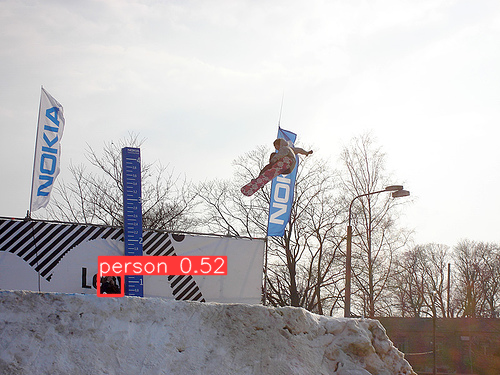

-1

In [ ]:
# Predict local data
import cv2
from google.colab.patches import cv2_imshow

img_pth = '/content/datasets/coco-2017/images/train/000000000360.jpg'

results = model(source=img_pth)
res_plotted = results[0].plot()
cv2_imshow(res_plotted)
cv2.waitKey(0)

100%|██████████| 476k/476k [00:00<00:00, 11.6MB/s]

image 1/1 /content/bus.jpg: 640x480 4 persons, 24.8ms
Speed: 3.5ms preprocess, 24.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


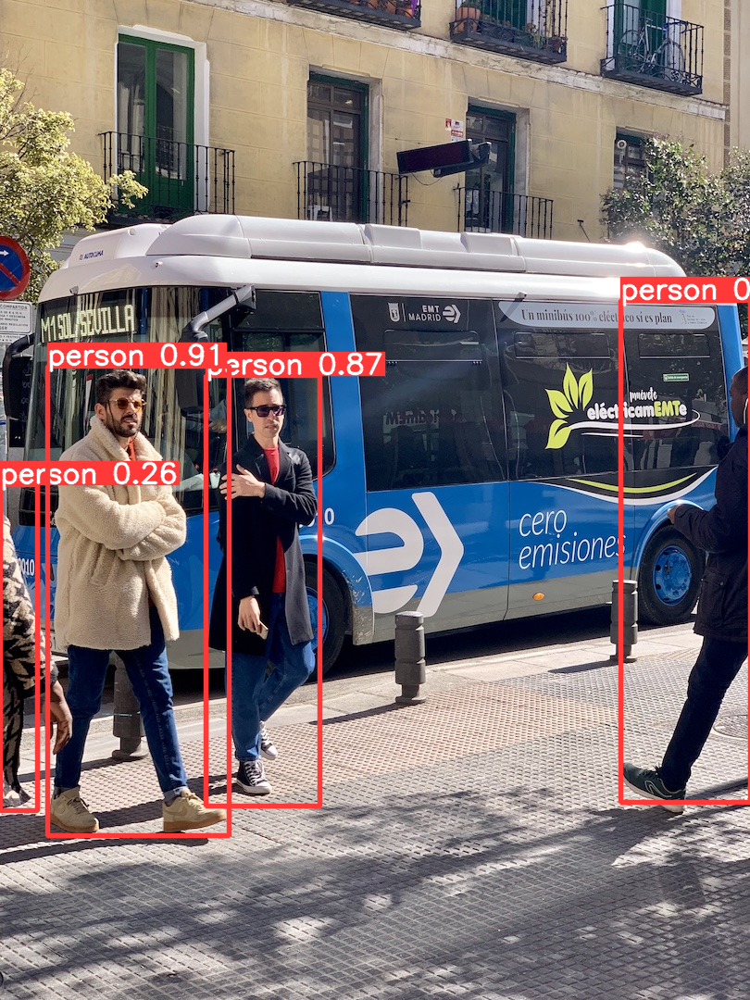

-1

In [ ]:
# Predict online data
source = 'https://ultralytics.com/images/bus.jpg'
results = model(source)
res_plotted = results[0].plot()
cv2_imshow(res_plotted)
cv2.waitKey(0)

In [ ]:
'''
Tips: Untuk menghindari runtime timeout

1. Buka inspect pada Chrome
2. Klik tab console
3. Paste kode berikut:

function ClickConnect(){
console.log("Working");
document
  .querySelector('#top-toolbar > colab-connect-button')
  .shadowRoot.querySelector('#connect')
  .click()
}
setInterval(ClickConnect, 60000)

4. Tekan Enter.

NOTE: Dengan memakai cara ini akan ada kemungkinan terjadi tumpukan layer captcha (saat colab ditinggal terlalu lama).
Klik saja satu per satu hingga semuanya tertutup.
'''

'\nTips: Untuk menghindari runtime timeout\n\n1. Buka inspect pada Chrome\n2. Klik tab console\n3. Paste kode berikut:\n\nfunction ClickConnect(){\nconsole.log("Working");\ndocument\n  .querySelector(\'#top-toolbar > colab-connect-button\')\n  .shadowRoot.querySelector(\'#connect\')\n  .click()\n}\nsetInterval(ClickConnect, 60000)\n\n4. Tekan Enter.\n'